<a href="https://colab.research.google.com/github/ShengjieMao/tiktok_ds_analysis/blob/main/tiktok_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tiktok User Behavior Analysis

## Libraries imports

In [1]:
import pandas as pd
import numpy as np

!pip install pyecharts
from pyecharts.charts import *
from pyecharts import options as opts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.7/147.7 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 19.5 MB/s eta 0:00:00


In [2]:
from sklearn.cluster import KMeans
import joblib
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc
from sklearn import ensemble
from sklearn.model_selection import GridSearchCV

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['font.size'] = 20

## Preprocessing

In [7]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/douyin_dataset.csv')
df.head()

,Unnamed: 0,uid,user_city,item_id,author_id,item_city,channel,finish,like,music_id,duration_time,real_time,H,date
0,3,15692,109.0,691661,18212,213.0,0,0,0,11513.0,10,2019-10-28 21:55:10,21,2019-10-28
1,5,44071,80.0,1243212,34500,68.0,0,0,0,1274.0,9,2019-10-21 22:27:03,22,2019-10-21
2,16,10902,202.0,3845855,634066,113.0,0,0,0,762.0,10,2019-10-26 00:38:51,0,2019-10-26
3,19,25300,21.0,3929579,214923,330.0,0,0,0,2332.0,15,2019-10-25 20:36:25,20,2019-10-25
4,24,3656,138.0,2572269,182680,80.0,0,0,0,238.0,9,2019-10-21 20:46:29,20,2019-10-21


In [8]:
del df['Unnamed: 0']

In [9]:
df.info(null_counts = True)

<ipython-input-9-a6d95acf2e87>:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  df.info(null_counts = True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1737312 entries, 0 to 1737311
Data columns (total 13 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   uid            1737312 non-null  int64  
 1   user_city      1737312 non-null  float64
 2   item_id        1737312 non-null  int64  
 3   author_id      1737312 non-null  int64  
 4   item_city      1737312 non-null  float64
 5   channel        1737312 non-null  int64  
 6   finish         1737312 non-null  int64  
 7   like           1737312 non-null  int64  
 8   music_id       1737312 non-null  float64
 9   duration_time  1737312 non-null  int64  
 10  real_time      1737312 non-null  object 
 11  H              1737312 non-null  int64  
 12  date           1737312 non-null  object 
dtypes: float64(3), int64(8), object(2)
memory usage: 172.3+ MB


## Properties Determine

Users properties extraction


In [10]:
user_df = pd.DataFrame()
# store each users data by uid
user_df['uid'] = df.groupby('uid')['like'].count().index.tolist()
user_df.set_index('uid', inplace=True)

# get users' stats properties
user_df['user_views'] = df.groupby('uid')['like'].count() # views amount
user_df['user_likes']  = df.groupby('uid')['like'].sum() # liked amount
user_df['user_others'] = df.groupby(['uid']).agg({'author_id':pd.Series.nunique}) # viewed other users amount
user_df['user_posts'] = df.groupby(['uid']).agg({'item_id':pd.Series.nunique}) # views posts amount
user_df['user_avg'] = df.groupby(['uid'])['duration_time'].mean() # averge time spends on each post
user_df['user_music'] = df.groupby(['uid']).agg({'music_id':pd.Series.nunique}) # music views amount
user_df['user_complete']  = df.groupby('uid')['finish'].sum() # complete views amount
user_df['user_city_visited'] = df.groupby(['uid']).agg({'user_city':pd.Series.nunique}) # cities been to amount
user_df['user_city_views'] = df.groupby(['uid']).agg({'item_city':pd.Series.nunique}) # views amount based on city
user_df.describe()
# export new table
user_df.to_csv('userChar.csv', encoding='utf_8_sig')

Authors properties extraction


In [11]:
author_df = pd.DataFrame()
author_df['author_id'] = df.groupby('author_id')['like'].count().index.tolist()
author_df.set_index('author_id', inplace=True)
author_df['total_view'] = df.groupby('author_id')['like'].count()
author_df['total_like']  = df.groupby('author_id')['like'].sum()
author_df['total_complete']  = df.groupby('author_id')['finish'].sum()
author_df['total_post'] = df.groupby('author_id').agg({'item_id':pd.Series.nunique})

item_time = df.groupby(['author_id', 'item_id']).mean().reset_index()
author_df['post_avg'] = item_time.groupby('author_id')['duration_time'].mean()

author_df['total_music'] = df.groupby('author_id').agg({'music_id':pd.Series.nunique})
author_df['total_dates'] = df.groupby('author_id').agg({'real_time':pd.Series.nunique})

author_days = df.groupby('author_id')['date']
_ = pd.to_datetime(author_days.max()) - pd.to_datetime(author_days.min())
author_df['active_dates'] = _.astype('timedelta64[D]').astype(int) + 1
author_df['total_city'] = df.groupby(['author_id']).agg({'item_city':pd.Series.nunique})
author_df.describe()

author_df.to_csv('authorChar.csv', encoding='utf_8_sig')

<ipython-input-11-8d6dcc38a1f2>:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  item_time = df.groupby(['author_id', 'item_id']).mean().reset_index()


Posts properties extraction

In [12]:
item_df = pd.DataFrame()
item_df['item_id'] = df.groupby('item_id')['like'].count().index.tolist()
item_df.set_index('item_id', inplace=True)
item_df['views_amount'] = df.groupby('item_id')['like'].count()
item_df['likes_amount']  = df.groupby('item_id')['like'].sum()
item_df['post_location'] = df.groupby('item_id')['item_city'].mean()
item_df['post_music'] = df.groupby('item_id')['music_id'].mean()

item_df.to_csv('postsChar.csv', encoding='utf_8_sig')

## Data Visualization

### Design Visulization charts

In [13]:
def line_chart(t, data):
    chart = (
        Line(init_opts = opts.InitOpts(theme='light', width='500px', height='300px'))
        .add_xaxis([i[0] for i in data])
        .add_yaxis(
            '',
            [i[1] for i in data],
            is_symbol_show=False,
            areastyle_opts=opts.AreaStyleOpts(opacity=1, color="cyan")
        )
        .set_global_opts(
            title_opts=opts.TitleOpts(title=t),
            xaxis_opts=opts.AxisOpts(type_="category", boundary_gap=True),
            yaxis_opts=opts.AxisOpts(
                type_="value",
                axistick_opts=opts.AxisTickOpts(is_show=True),
                splitline_opts=opts.SplitLineOpts(is_show=True),
            ),
        )
    )
    return chart

In [14]:
def pie_chart(t, data_pair):
    chart = (
        Pie(init_opts=opts.InitOpts(theme='light', width='550px', height='300px'))
        .add('', data_pair ,radius=["30%", "45%"],
            label_opts=opts.LabelOpts(formatter="{b}: {d}%")
        )
        .set_global_opts(
            title_opts=opts.TitleOpts(
                title=t
             ),
            legend_opts=opts.LegendOpts(pos_left="0%",pos_top="55",orient='vertical')
        )
    )
    return chart

In [15]:
def fl_chart(t, data):
    chart = (
        Funnel(init_opts=opts.InitOpts(theme='light', width='500px', height='300px'))
        .add('', data, label_opts=opts.LabelOpts(formatter='{d}%', position='right'))
        .set_global_opts(
            title_opts=opts.TitleOpts(title=t),
        legend_opts=opts.LegendOpts(pos_left="0%",pos_top="55",orient='vertical')
        )
    )
    return chart

### Users charts

In [16]:
# analyzing users
user_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/userChar.csv')
user_df.head()

,uid,user_views,user_likes,user_others,user_posts,user_avg,user_music,user_complete,user_city_visited,user_city_views
0,0,34,0,31,34,12.058824,31,18,1,28
1,1,28,1,28,28,12.357143,26,14,1,25
2,2,56,0,56,56,10.357143,47,19,3,45
3,3,117,1,116,117,9.982906,89,60,1,76
4,4,123,0,117,123,10.853659,94,77,1,84


In [17]:
bins = [0, 5, 10, 25, 50, 100, 1951]
data = pd.cut(user_df['user_views'], bins, right=True,labels=[f'({bins[x]}, {bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().values.tolist()
pie_chart('User View Amounts Distribution', data).render_notebook()

In [18]:
temp = user_df['user_views'].sort_values(ascending=False).reset_index().cumsum()['user_views']
temp = temp/temp.max()
data = temp.reset_index().values.tolist()

line_chart('User Views %', data).render_notebook()

In [19]:
# User likes amount
bins = [-1, 0, 1, 183]
data = pd.cut(user_df['user_likes'], bins, right=True,labels=[f'({bins[x]}，{bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().sort_values(by='index').values.tolist()
pie_chart('User Likes Amounts Distribution', data).render_notebook()

In [20]:
_ = temp.tolist()
for j in range(10):
    j /= 10
    for i in _:
        if i>=j:
            flag = i
            break
    c = _.index(flag)/len(_)
    print(f'{c:4.1%} Users liked {j:3.0%} posts')

0.0% Users liked  0% posts
0.8% Users liked 10% posts
2.2% Users liked 20% posts
4.2% Users liked 30% posts
6.9% Users liked 40% posts
10.6% Users liked 50% posts
15.3% Users liked 60% posts
21.7% Users liked 70% posts
30.8% Users liked 80% posts
45.6% Users liked 90% posts


In [21]:
# amount of users completely viewed the posts
bins = [0, 5, 10, 20, 30, 50, 284]
data = pd.cut(user_df['user_complete'], bins, right=True,labels=[f'({bins[x]}，{bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().values.tolist()
pie_chart('Users Complete View Distribution', data).render_notebook()

In [22]:
# average views distribution
bins = [1, 10, 12, 15, 42]
data = pd.cut(
    user_df['user_avg'],
    bins, right=True,labels=[f'({bins[x]}, {bins[x+1]}]' for x in range(len(bins)-1)]
).value_counts()
data = data.sort_index(ascending=False).cumsum().reset_index().values.tolist()
fl_chart('user_avg', data).render_notebook()

In [23]:
# users visited cities amount as a potential factor
data = user_df['user_city_visited'].value_counts().reset_index().values.tolist()
pie_chart('Cities Visited Distribution', data).render_notebook()

### Author Charts

In [24]:
# get data
author_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/authorChar.csv')
author_df.head()

,author_id,total_view,total_like,total_complete,total_post,post_avg,total_music,total_dates,active_dates,total_city
0,0,1,0,0,1,10.000000,1,1,1,1
1,1,16,0,8,3,8.333333,3,3,9,1
2,3,311,3,203,1,9.000000,1,1,1,1
3,5,1054,33,485,5,8.200000,4,5,28,1
4,8,4,0,3,1,19.000000,1,1,1,1


In [25]:
# viewing amount
bins = [0, 1, 5, 10, 20, 50, 2648]
data = pd.cut(author_df['total_view'], bins, right=True,labels=[f'({bins[x]}, {bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().values.tolist()
pie_chart('Total View Distribution', data).render_notebook()

In [26]:
# Likes amount
bins = [-1, 0, 1, 36]
data = pd.cut(author_df['total_like'], bins, right=True,labels=[f'({bins[x]}, {bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().sort_values(by='index').values.tolist()
pie_chart('Likes Amount Distribution', data).render_notebook()

In [27]:
# 2/8 distribution
temp = author_df['total_like'].sort_values(ascending=False).reset_index().cumsum()['total_like'].reset_index()
temp = temp/temp.max()
temp['index'] = temp['index'].apply(lambda x: format(x, '.2%'))
data = temp[temp['total_like']<0.999999999999999999].values.tolist()

line_chart('Cumulative Likes Amount Distribution', data).render_notebook()

In [28]:
_ = temp['total_like'].tolist()
for j in range(10):
    j /= 10
    for i in _:
        if i>=j:
            flag = i
            break
    c = _.index(flag)/len(_)
    print(f'{c:4.1%} Authors Reveived {j:3.0%} Likes')

0.0% Authors Reveived  0% Likes
0.1% Authors Reveived 10% Likes
0.2% Authors Reveived 20% Likes
0.4% Authors Reveived 30% Likes
0.7% Authors Reveived 40% Likes
1.1% Authors Reveived 50% Likes
1.8% Authors Reveived 60% Likes
2.6% Authors Reveived 70% Likes
3.4% Authors Reveived 80% Likes
4.2% Authors Reveived 90% Likes


Did not include the cities amount that the authors of posts have been to in this analysis.

### Posts Charts

In [29]:
# get data
item_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/postsChar.csv')
item_df.head()

,item_id,views_amount,likes_amount,post_location,post_music
0,0,24,0,24.0,220.0
1,1,1309,5,63.0,574.0
2,3,2,0,7.0,26289.0
3,4,613,3,146.0,162.0
4,7,2,0,33.0,540.0


In [31]:
# posts amount based on date
data = df.groupby(['date']).agg({'item_id':pd.Series.nunique}).reset_index().values.tolist()
line_chart("Posts Amount Changes Based on Dates", data).render_notebook()

In [32]:
# Views distribution
bins = [0, 1, 2, 4, 1600]
item_df['rank_views'] = pd.cut(item_df['views_amount'], bins, labels=[f'({bins[x]}, {bins[x+1]}]' for x in range(len(bins)-1)])
data = item_df.groupby('rank_views')['views_amount'].count().reset_index().values.tolist()
pie_chart('Views Amount Distribution', data).render_notebook()

In [33]:
# Likes distribution
bins = [-1, 0, 1, 3, 5, 10, 35]
item_df['rank_likes'] = pd.cut(item_df['likes_amount'], bins, labels=[f'[{bins[x]}, {bins[x+1]})' for x in range(len(bins)-1)], right=False)
data = item_df.groupby('rank_likes')['likes_amount'].sum().reset_index().values.tolist()
pie_chart('Likes Amount Distribution', data).render_notebook()

## Model Buildings -- K-means

### data preprocessing



In [34]:
# get necessary data
user_feature = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/userChar.csv', index_col=0)
author_feature = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/authorChar.csv', index_col=0)

Filter out users that are more likely to complete viewing a post in this analysis since they are more possible to make commercial effects.

In [35]:
user_data = user_feature[(user_feature['user_complete']>=1)&(user_feature['user_views']>=5)]
print(len(user_data)/len(user_feature))

0.7097514856834144


In [36]:
author_data = author_feature[(author_feature['total_complete']>=1)&(author_feature['total_view']>=3)]
print(len(author_data)/len(author_feature))

0.2990244347629775


In [37]:
def km(data, name):
    K = range(2, 10)
    X = data
    # scores = { 'SSE': [], 'sc': [], 'sse': []}
    scores = {'sc': [], 'sse': []}
    for _k in K:
        # init model
        kmeans = KMeans(n_clusters=_k, init='k-means++', random_state=0)
        kmeans.fit(X)
        _y = kmeans.predict(X)
        # get score
        sse = sum(np.min(cdist(X,kmeans.cluster_centers_,'euclidean'),axis=1))/X.shape[0]
        sc = metrics.silhouette_score(X, _y)
        joblib.dump(kmeans, f'{name}{_k}cluster.model')
        # store scores
        scores['sse'].append(sse)
        scores['sc'].append(sc)
        print(f'cluster #{_k} completed', end='\t')
    joblib.dump(scores, f'{name}cluster_idx.score')
    print('Finished index saving')
    return scores

In [38]:
# design plot
def draw(k, sse, sc):
    chart = (
        Line(init_opts=opts.InitOpts(
            theme='light',
            width='350px',
            height='350px'
        ))
        .add_xaxis(k)
        .add_yaxis('sse', sse, yaxis_index=0, label_opts=opts.LabelOpts(is_show=False))
        .add_yaxis('sc', sc, yaxis_index=1, label_opts=opts.LabelOpts(is_show=False))
        .extend_axis(yaxis=opts.AxisOpts())
        .set_global_opts(
            title_opts=opts.TitleOpts(title='Clusters performance'),
            xaxis_opts=opts.AxisOpts(type_="category", boundary_gap=True),
            yaxis_opts=opts.AxisOpts(
                type_="value",
                axistick_opts=opts.AxisTickOpts(is_show=True),
                splitline_opts=opts.SplitLineOpts(is_show=True),
            ),
        )
    )
    return chart

### Users Model

Implementation on Data

In [39]:
user_score = km(user_data, 'user')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #2 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #3 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #4 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #5 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #6 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #7 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #8 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #9 completed	Finished index saving


In [40]:
# choose k value
user_score =  joblib.load(f'usercluster_idx.score')
draw([str(x) for x in range(2,10)], user_score['sse'], user_score['sc']).render_notebook()

Based on the graph, choose k=4

In [41]:
user_km = joblib.load(f'user4cluster.model')
user_centers = pd.DataFrame(user_km.cluster_centers_, columns=user_feature.columns)
user_centers['population']=pd.Series(user_km.predict(user_data)).value_counts()
user_centers

,user_views,user_likes,user_others,user_posts,user_avg,user_music,user_complete,user_city_visited,user_city_views,population
0,16.775609,0.189479,16.497164,16.775474,11.315182,15.919846,8.118239,1.170268,14.559761,29629
1,162.442748,1.256870,154.682443,162.440840,11.079400,131.776336,54.049618,1.293130,88.605725,2615
2,381.603365,3.012019,353.144231,381.598558,10.969891,276.408654,92.346154,1.324519,140.896635,416
3,65.460899,0.654698,63.523652,65.460047,11.174836,57.955359,27.401982,1.274132,47.041551,9380


### Authors model

In [42]:
author_score = km(author_data, 'author')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #2 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #3 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #4 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #5 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #6 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #7 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #8 completed	

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


cluster #9 completed	Finished index saving


In [43]:
# choose k value
author_score =  joblib.load(f'authorcluster_idx.score')
draw([str(x) for x in range(2,10)], author_score['sse'], author_score['sc']).render_notebook()

based on the plot, choose k=4

In [44]:
author_km = joblib.load(f'author4cluster.model')
author_centers = pd.DataFrame(author_km.cluster_centers_, columns=author_feature.columns)
author_centers['population'] = pd.Series(author_km.predict(author_data)).value_counts()
author_centers

,total_view,total_like,total_complete,total_post,post_avg,total_music,total_dates,active_dates,total_city,population
0,11.973167,0.115981,5.019598,3.636747,10.783111,3.198138,3.636625,11.301008,1.114046,57356
1,376.060858,3.428769,165.146611,20.035961,11.126590,13.811895,20.034578,24.224066,1.289073,723
2,1092.821053,8.347368,461.315789,31.126316,11.165662,19.957895,31.126316,27.926316,1.326316,95
3,117.075717,1.148983,51.548395,12.432737,10.993801,9.434942,12.431267,21.253124,1.236217,4079


## Prediction

### Preprocessing

In [46]:
df_pred = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tiktokAna/douyin_dataset.csv')
del df_pred['Unnamed: 0'], df_pred['H'], df_pred['date'], df_pred['finish'], df_pred['channel']
df_pred.head()

,uid,user_city,item_id,author_id,item_city,like,music_id,duration_time,real_time
0,15692,109.0,691661,18212,213.0,0,11513.0,10,2019-10-28 21:55:10
1,44071,80.0,1243212,34500,68.0,0,1274.0,9,2019-10-21 22:27:03
2,10902,202.0,3845855,634066,113.0,0,762.0,10,2019-10-26 00:38:51
3,25300,21.0,3929579,214923,330.0,0,2332.0,15,2019-10-25 20:36:25
4,3656,138.0,2572269,182680,80.0,0,238.0,9,2019-10-21 20:46:29


In [47]:
# randomly choose samples from database for training
df_like = df_pred[df_pred['like']==1]
df_dislike = df_pred[df_pred['like']==0]
data = pd.concat([df_like[::20], df_dislike[::40]], axis=0)
print(len(data)/len(df))

0.02524186789707318


In [48]:
# data format checks
flag = pd.to_datetime('2019-01-01 00:00:00')
data['real_time'] = pd.to_datetime(data['real_time'])
data['real_time'] = pd.to_timedelta( data['real_time'] - flag).dt.total_seconds()

In [49]:
data.head()

,uid,user_city,item_id,author_id,item_city,like,music_id,duration_time,real_time
134,32039,2.0,1324665,48937,15.0,1,578.0,10,24181411.0
2181,14571,142.0,2489542,37131,229.0,1,1318.0,7,25305835.0
3955,25090,136.0,1582882,16382,69.0,1,680.0,10,23180382.0
5685,11153,73.0,209250,28248,137.0,1,4545.0,9,24856880.0
8647,2159,106.0,1019916,246,18.0,1,3928.0,9,25677638.0


In [50]:
# split test/train data
xtrain,xtest, ytrain, ytest = \
    train_test_split(
        data.drop('like', axis=1), # X
        data['like'],test_size=0.3, # Y
        random_state=0 # random_seed
    )

### Model design

In [51]:
def train(name, model):
    model = model.fit(xtrain, ytrain)
    print(f'{name} accuracy: \t{model.score(xtest, ytest)}')
    return model

In [52]:
# logics regression
lgs = train('lgs', LogisticRegression(solver='liblinear', C=100.0,random_state=1))
# gaussian
gnb = train('gnb', GaussianNB().fit(xtrain,ytrain))
# decision tree
clf = train('clf', DecisionTreeClassifier(class_weight='balanced',random_state=0))
# random forest
rfc = train('rfc', RandomForestClassifier(n_estimators=100, class_weight='balanced',random_state=0))

lgs accuracy: 	0.9805411979325023
gnb accuracy: 	0.9801611432046214
clf accuracy: 	0.9601702645180906
rfc accuracy: 	0.9805411979325023


In [53]:
# AUC
def my_auc(model):
    y_test_proba = model.predict_proba(xtest)
    false_positive_rate, recall, thresholds = roc_curve(ytest, y_test_proba[:, 1])
    roc_auc = auc(false_positive_rate, recall)
    return false_positive_rate, recall, roc_auc

In [54]:
lgs_auc = my_auc(lgs)
gnb_auc = my_auc(gnb)
clf_auc = my_auc(clf)
rfc_auc = my_auc(rfc)

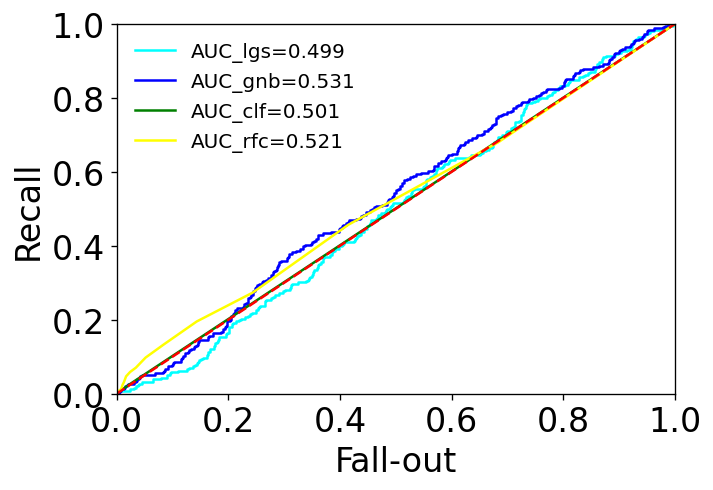

In [55]:
plt.figure(figsize=(6,4),dpi=120)
plt.plot(lgs_auc[0], lgs_auc[1], color='cyan', label='AUC_lgs=%0.3f' % lgs_auc[2])
plt.plot(gnb_auc[0], gnb_auc[1], color='blue', label='AUC_gnb=%0.3f' % gnb_auc[2])
plt.plot(clf_auc[0], clf_auc[1], color='green', label='AUC_clf=%0.3f' % clf_auc[2])
plt.plot(rfc_auc[0], rfc_auc[1], color='yellow', label='AUC_rfc=%0.3f' % rfc_auc[2])
plt.legend(loc='best', fontsize=12, frameon=False)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.ylabel('Recall')
plt.xlabel('Fall-out')
plt.show()

The auc value should increase as the sample size grows. So far based on the score, we can choose the random forest as a more acceptable model for the remaining analysis.

### Model Improvement

In [60]:
# n estimators
params = {
    'n_estimators': [x for x in range(100,1500,100)]
}
grid = GridSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=0),
    params, scoring="roc_auc",
    cv=3, verbose=1, n_jobs=-1
).fit(xtrain, ytrain)

Fitting 3 folds for each of 14 candidates, totalling 42 fits


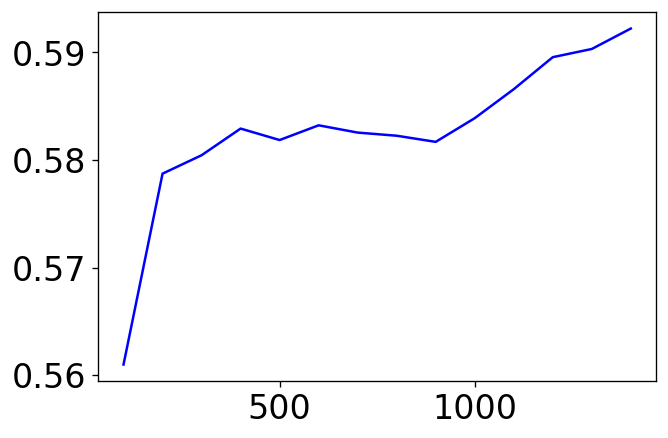

In [57]:
a = grid.cv_results_['mean_test_score']
plt.figure(figsize=(6,4),dpi=120)
plt.plot(params['n_estimators'], a, color='blue')
plt.show()

In [58]:
grid.best_params_

{'n_estimators': 1400}

As shown on the result, should choose 1000 as param

In [61]:
# max features
params = {
    'max_features': range(2,10,2)
}
grid = GridSearchCV(
    RandomForestClassifier(n_estimators=1000, class_weight='balanced', random_state=0),
    params, scoring="roc_auc",
    cv=3, verbose=1, n_jobs=-1
).fit(xtrain, ytrain)

Fitting 3 folds for each of 4 candidates, totalling 12 fits


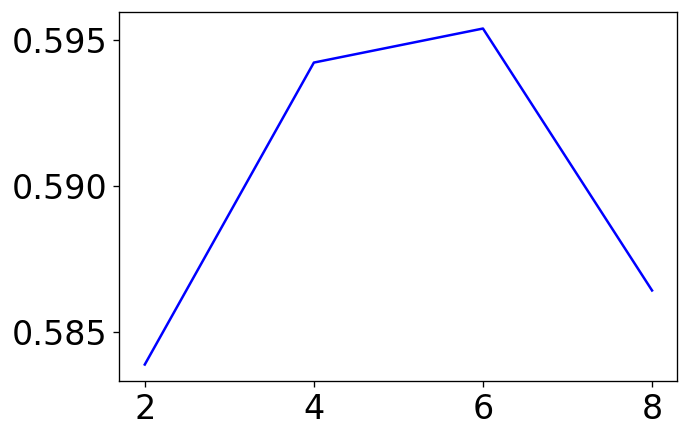

In [62]:
a = grid.cv_results_['mean_test_score']
plt.figure(figsize=(6,4),dpi=120)
plt.plot(params['max_features'], a, color='blue')
plt.show()

In [63]:
grid.best_params_

{'max_features': 6}

Choose 6 as param

In [64]:
rfc0 = RandomForestClassifier(n_estimators=1000,
                             max_features=6,
                             class_weight='balanced',
                             random_state=0)
rfc0 = train('rfc++', rfc0)

rfc++ accuracy: 	0.9805411979325023


Compare the improved model with the original model auc score

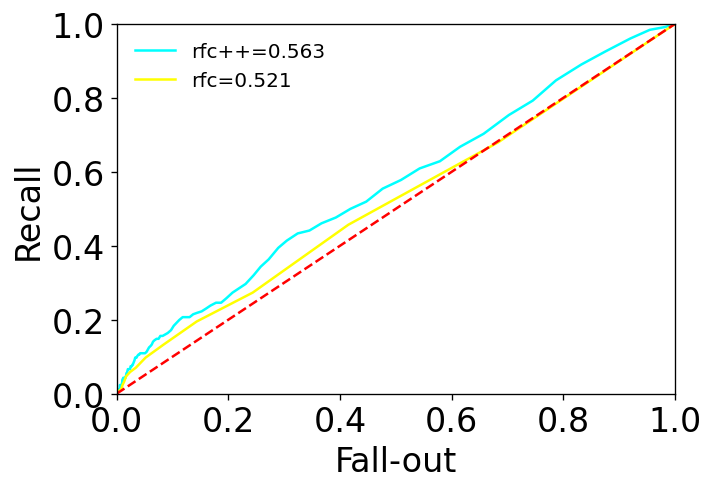

In [65]:
auc_rfc0 = my_auc(rfc0)
plt.figure(figsize=(6,4),dpi=120)
plt.plot(auc_rfc0[0], auc_rfc0[1], color='cyan', label='rfc++=%0.3f' % auc_rfc0[2])
plt.plot(rfc_auc[0], rfc_auc[1], color='yellow', label='rfc=%0.3f' % rfc_auc[2])
plt.legend(loc='best', fontsize=12, frameon=False)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.ylabel('Recall')
plt.xlabel('Fall-out')
plt.show()

### Test the score

In [68]:
flag = pd.to_datetime('2019-01-01 00:00:00')
df_pred['real_time'] = pd.to_datetime(df_pred['real_time'])
df_pred['real_time'] = pd.to_timedelta( df_pred['real_time'] - flag).dt.total_seconds()

In [69]:
rfc0.score(df_pred.drop('like', axis=1), df_pred['like'])

0.9906522259674716